<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------
Student numbers: <span style="color:red">r0481422, r0774566, r0766888, r0692123, r0856883</span>. (fill in your student numbers!)

In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 0* and you start from this template notebook. The notebook you submit for grading is the last notebook you submit in the [Kaggle competition](https://www.kaggle.com/t/b7a2a8743bd842ca9ac93ae91cbc8d9f) prior to the deadline on **Tuesday 18 May 23:59**. Closely follow [these instructions](https://github.com/gourie/kaggle_inclass) for joining the competition, sharing your notebook with the TAs and making a valid notebook submission to the competition. A notebook submission not only produces a *submission.csv* file that is used to calculate your competition score, it also runs the entire notebook and saves its output as if it were a report. This way it becomes an all-in-one-place document for the TAs to review. As such, please make sure that your final submission notebook is self-contained and fully documented (e.g. provide strong arguments for the design choices that you make). Most likely, this notebook format is not appropriate to run all your experiments at submission time (e.g. the training of CNNs is a memory hungry and time consuming process; due to limited Kaggle resources). It can be a good idea to distribute your code otherwise and only summarize your findings, together with your final predictions, in the submission notebook. For example, you can substitute experiments with some text and figures that you have produced "offline" (e.g. learning curves and results on your internal validation set or even the test set for different architectures, pre-processing pipelines, etc). We advise you to first go through the PDF of this assignment entirely before you really start. Then, it can be a good idea to go through this notebook and use it as your first notebook submission to the competition. You can make use of the *Group assignment 1* forum/discussion board on Toledo if you have any questions. Good luck and have fun!

---------------------------------------------------------------



# 1. Overview
This assignment consists of *three main parts* for which we expect you to provide code and extensive documentation in the notebook:
* Image classification (Sect. 2)
* Semantic segmentation (Sect. 3)
* Adversarial attacks (Sect. 4)

In the first part, you will train an end-to-end neural network for image classification. In the second part, you will do the same for semantic segmentation. For these two tasks we expect you to put a significant effort into optimizing performance and as such competing with fellow students via the Kaggle competition. In the third part, you will try to find and exploit the weaknesses of your classification and/or segmentation network. For the latter there is no competition format, but we do expect you to put significant effort in achieving good performance on the self-posed goal for that part. Finally, we ask you to reflect and produce an overall discussion with links to the lectures and "real world" computer vision (Sect. 5). It is important to note that only a small part of the grade will reflect the actual performance of your networks. However, we do expect all things to work! In general, we will evaluate the correctness of your approach and your understanding of what you have done that you demonstrate in the descriptions and discussions in the final notebook.

## 1.1 Deep learning resources
If you did not yet explore this in *Group assignment 0 (Sect. 2)*, we recommend using the TensorFlow and/or Keras library for building deep learning models. You can find a nice crash course [here](https://colab.research.google.com/drive/1UCJt8EYjlzCs1H1d1X0iDGYJsHKwu-NO).

In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import urllib.request

import numpy as np
from numpy import *
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer, MultiLabelBinarizer
from sklearn.metrics import average_precision_score

import tensorflow as tf
import keras
from keras import backend as K
from keras import utils, regularizers
from keras.applications import VGG16
from keras.models import Sequential, Model, load_model
from keras.layers import Input, Dense, Convolution2D, Conv2D, MaxPooling2D, AveragePooling2D, ZeroPadding2D, Dropout, Flatten, Concatenate, Reshape, Activation, BatchNormalization, GlobalAveragePooling2D, Add, ActivityRegularization
from keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img
from keras.regularizers import l2
from keras.optimizers import SGD
from keras.utils.conv_utils import convert_kernel
from keras.metrics import Precision, Recall
from keras.callbacks import ModelCheckpoint



## 1.2 Load and analyze the PASCAL VOC 2009 dataset
For this project you will be using the [PASCAL VOC 2009](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/index.html) dataset. This dataset consists of colour images of various scenes with different object classes (e.g. animal: *bird, cat, ...*; vehicle: *aeroplane, bicycle, ...*), totalling 20 classes.

The training set contains 749 examples.


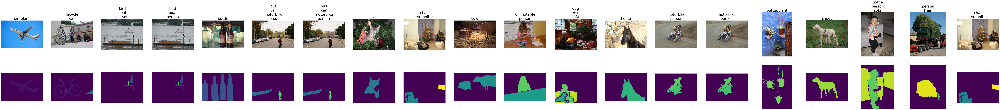

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [2]:
# Loading the training data
train_df = pd.read_csv('/kaggle/input/kul-h02a5a-computervision-groupassignment1/train/train_set.csv', index_col="Id")
labels = train_df.columns
train_df["img"] = [np.load('/kaggle/input/kul-h02a5a-computervision-groupassignment1/train/img/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load('/kaggle/input/kul-h02a5a-computervision-groupassignment1/train/seg/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
print("The training set contains {} examples.".format(len(train_df)))

# Show some examples
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)

Let's see the distribution of the classes in the training data.

In [3]:
train_df_class = train_df.drop(columns=['img', 'seg'])

train_df_class.head(1)

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,diningtable,dog,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor
Id,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


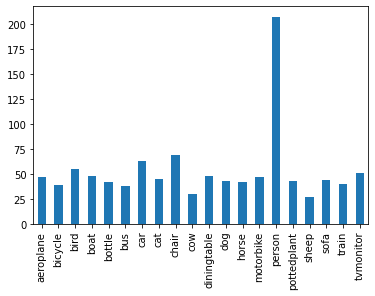

In [4]:
class_counts = train_df_class.sum()


ax = class_counts.plot.bar()

From this plot we can see that 'person' is the most common class, which seems to make the training data unbalanced. However, since we are doing multilabel classification, for each image we need to decide a binary for each class. And for most of the classes the answer is 0. The training image contains 749 images in total but most of classes only have around 50 counts. Hence other classes data are even more unbalanced than the 'person' class. 

Due the unbalanced data, it shows that accuracy is not a good option for metric. On the other hand, precision per class is more meaningful. Hence, we will be using **precision/recall and F1-score** for the evaluation of this multilabel classification model. 

In [5]:
# Loading the test data
test_df = pd.read_csv('/kaggle/input/kul-h02a5a-computervision-groupassignment1/test/test_set.csv', index_col="Id")
test_df["img"] = [np.load('/kaggle/input/kul-h02a5a-computervision-groupassignment1/test/img/test_{}.npy'.format(idx)) for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)

The test set contains 750 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


## 1.3 Your Kaggle submission
Your filled test dataframe (during Sect. 2 and Sect. 3) must be converted to a submission.csv with two rows per example (one for classification and one for segmentation) and with only a single prediction column (the multi-class/label predictions running length encoded). You don't need to edit this section. Just make sure to call this function at the right position in this notebook.

In [6]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

# 2. Image classification
The goal here is simple: implement a classification CNN and train it to recognise all 20 classes (and/or background) using the training set and compete on the test set (by filling in the classification columns in the test dataframe).

## 2.1 Build a model from scratch 

### 2.1.0 Prepare the Data for the model

Load the preprocess train and test images in the numpy array format after resizing to (128x128x3) and normalization

In [7]:
import os

prep_path = '../input/a1-clf-imagedata-tensor/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
X = np.load(os.path.join(prep_path, 'Xtrain_128.npy'))
y = np.load(os.path.join(prep_path, 'Ytrain.npy'))
X_pred = np.load(os.path.join(prep_path, 'Xtest_128.npy'))

check the dimension of the loaded training data

In [8]:
X.shape

(749, 128, 128, 3)

plot a few example of the training image and their label

In [9]:
def get_picture_label(y):
    title = []

    for i, element in enumerate(y):
        if element == 1:
#             print('found')
            title.append(labels[i])
            
    return title        
        

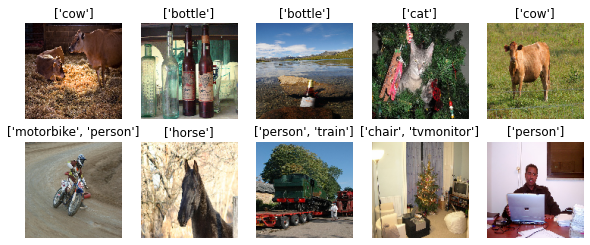

In [10]:

fig=plt.figure(figsize=(10, 4))
columns = 5
rows = 2

for i in range(columns * rows):

    img = X[i]
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.title(get_picture_label(y[i]))
    plt.axis('off')
    
plt.show()

Now we split the dataset into a training set(80%), a validation set(20%). We can use the validation set to assess our performance on an unseen data source during training.

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

print("Number of training examples: {}".format(len(y_train)))
print("Number of validation examples: {}".format(len(y_val)))


Number of training examples: 599
Number of validation examples: 150


In order to avoid overfitting and to train on more data, we apply data augmentation on the training set with ImageDataGenerator. When loading an image for training, the ImageDataGenerator will apply a certain horizontal flip, rotation, rescale, zoom, width and height shift before it is passed to the model. This should make our model more robust.

In [12]:
from keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img

# Create image data augmentation generator
datagen = ImageDataGenerator(
                    rotation_range=30,
                    width_shift_range=.1,
                    height_shift_range=.1,
                    horizontal_flip=True,
                    shear_range=0.2,
                    zoom_range=0.3,
                    fill_mode="nearest"
                    )

Let's visualize some of the augmented images from training set

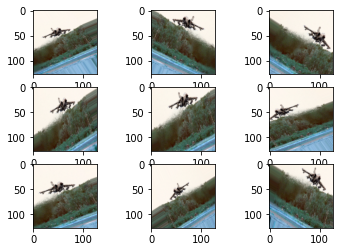

In [13]:
# Visualize the data Augmentation in an image from the train set
img_sample = X_train[60]
img = array_to_img(img_sample)
data = img_to_array(img)
samples = np.expand_dims(data, 0) # expand dimension to one sample
it = datagen.flow(samples, batch_size=1) # prepare iterator
for i in range(9): # generate samples and plot
    plt.subplot(330 + 1 + i) # define subplot
    batch = it.next() # generate batch of images
    image = batch[0].astype('uint8') # convert to unsigned integers for viewing
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # convert to RGB for viewing
    plt.imshow(image) # plot raw pixel data
# show the figure
plt.show()

We see that we still get somewhat realistic variations of our input picture. This should make our model recognize a certain class even when it is pictured sideways or upside down.



### 2.1.1 Motivation for the model architecture 

We decide to approach this task inspired by in the following iterature:

[Shetty, S. (2016). Application of convolutional neural network for image classification on Pascal VOC challenge 2012 dataset. arXiv preprint arXiv:1607.03785.](https://arxiv.org/abs/1607.03785)

We decide to take a step-by-step approach to investigate the study of building CNN from scratch for the classification tasks. We have built three CNN models from scratch: 

- **Model 1: a simple CNN with just limited number of convolution layers and pooling layers.**

- **Model 2: a more complex and deeper compared to Model 1 with more convolution layers and pooling layers. Besides, batch-normalization layers and dropout layers are added as well.**

- **Model 3: a more complex and deeper compared to Model 2 with more convolution layers and pooling layers.**


The functions of different layers are briefly discussed below:

- **Convolution layer**: This essential layer in the CNN will extract local features from the input images. A kernel is moved over the input picture and multiple different activation maps can represent different features.

- **Max-pooling layer**: This layer reduce the number of parameters and computation in the network by reducing the size of the input. It does this by replacing an area of the input picture by its maximum.

- **Batch Normalization layer**: the layer ensures the distribution of the input data remains similar over time. It is a bit controversial in the sense that often people claim that no one really knows why it works but it does tend to increase generalisability and make convergence faster.

- **ReLU activation layer**: The ReLU layer can be used as the output of each convolution layer or a fully-connected layer. The ReLU function computes  f(x) = max(0,x). The ReLU layers generally improve the network training speed.


- **Dropout layer**: Dropout is used to control overfitting problem. During the training, it drops a neuron with a probaility of P and sets its connections to zero. 

- **Dense layer**: it represents a classical fully connected neuron layer as in non-convolutional neural networks. Two dense layers are used,one is 1x1024 and another is 1x20, which represents the 20 classes. 


- **Sigmoid activtion function**: after the last dense layer we apply the sigmoid function. This is usually used in binary problems. Now we will consider each possible class as a binary problem, which will genereate he probailities of each class in the range of [0-1]. 





### 2.1.2 Build the model

In [14]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization, Conv2D, MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
print(tf.__version__)
from sklearn.metrics import f1_score

2.4.1


In [15]:
from tensorflow.keras.utils import plot_model

In [16]:
def create_model_1():

    model = Sequential()    
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=X_train[0].shape, name='Conv2D_1'))
    model.add(MaxPool2D(pool_size=(2, 2), name='MaxPool_1'))
    
    model.add(Conv2D(64, (3, 3), activation='relu', name='Conv2D_2'))
    model.add(MaxPool2D(pool_size=(2, 2), name='MaxPool_2'))
    
    model.add(Conv2D(64, (3, 3), activation='relu', name='Conv2D_3'))

    # Fully connected layer and classifier
    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
    model.add(Dense(64, activation='relu')) #64
    
    model.add(Dense(20, activation='sigmoid'))

    return model

In [17]:
def create_model_2():
    model = Sequential()
    model.add(Conv2D(16, (3,3), activation='relu', input_shape = X_train[0].shape))
    model.add(BatchNormalization())
    model.add(MaxPool2D(2,2))
    model.add(Dropout(0.3))

    model.add(Conv2D(32, (3,3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(2,2))
    model.add(Dropout(0.3))

    model.add(Conv2D(64, (3,3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(2,2))
    model.add(Dropout(0.4))

    model.add(Conv2D(128, (3,3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(2,2))
    model.add(Dropout(0.5))

    model.add(Flatten())

    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))


    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))


    model.add(Dense(20, activation='sigmoid'))
    
    return model

In [18]:
def create_model_3():
    
    model = Sequential()

    # First convolutional block
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=X_train[0].shape, name='Conv2D_1.1'))
    model.add(BatchNormalization(axis=-1))
    model.add(Conv2D(32, (3, 3), activation='relu', name='Conv2D_1.2'))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPool2D(pool_size=(2, 2), name='MaxPool_1'))
    model.add(Dropout(0.26, name='Dropout_1'))

    # Second convolutional block
    model.add(Conv2D(64, (3, 3), activation='relu', name='Conv2D_2.1'))
    model.add(BatchNormalization(axis=-1))
    model.add(Conv2D(64, (3, 3), activation='relu', name='Conv2D_2.2'))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPool2D(pool_size=(2, 2), name='MaxPool_2'))
    model.add(Dropout(0.28, name='Dropout_2'))

    # Third convolutional block
    model.add(Conv2D(128, (3, 3), activation='relu', name='Conv2D_3.1'))
    model.add(BatchNormalization(axis=-1))
    model.add(Conv2D(128, (3, 3), activation='relu', name='Conv2D_3.2'))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPool2D(pool_size=(2, 2), name='MaxPool_3'))
    model.add(Dropout(0.29, name='Dropout_3'))

    # Fully connected layer and classifier
    model.add(Flatten())  
    model.add(Dense(256, activation='relu')) #256
    model.add(BatchNormalization())
    model.add(Dropout(0.48))
    model.add(Dense(64, activation='relu')) #64
    model.add(BatchNormalization())
    model.add(Dense(20, activation='sigmoid'))
    
    return model

Create and complie these models with the following loss function and metric: 

- **Loss function: binary cross-entropy.** We choose this instead of categorical cross-entropy, since we want to [treat each output label as an independent Bernoulli distribution. ](https://www.pyimagesearch.com/2018/05/07/multi-label-classification-with-keras/)

- **Metric: accuracy, f1_score, precision, recall.** We already know that accuracy is not the best metric for multilabel classification and unbalanced data. Precision, recall and f1_score are defined as followed:

$ Precision = \frac{TP}{TP+FP} $ 
Precision tries to answer: what proportion of positive identifications was actually correct?

$ Recall = \frac{TP}{TP+FN} $ 
Recall tries to answer: What proportion of actual positives was identified correctly?

$ F1 Score = \frac{2*Recall * Precision} {Recall + Precision} $
F1 Score is the weighted average of Precision and Recall. It is usually more useful than accuracy, especially if it comes to uneven class distribution. 


In [19]:
from tensorflow.keras.optimizers import Adadelta
from tensorflow.keras.metrics import Precision, Recall
from tensorflow_addons.metrics import HammingLoss, F1Score

# Create model 1
clf_model_1 = create_model_1()

# Compile the model 1: set loss function, optimizer and optimization metric
clf_model_1.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy',F1Score(num_classes=20),Precision(),Recall()])

print(clf_model_1.summary())



Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv2D_1 (Conv2D)            (None, 126, 126, 32)      896       
_________________________________________________________________
MaxPool_1 (MaxPooling2D)     (None, 63, 63, 32)        0         
_________________________________________________________________
Conv2D_2 (Conv2D)            (None, 61, 61, 64)        18496     
_________________________________________________________________
MaxPool_2 (MaxPooling2D)     (None, 30, 30, 64)        0         
_________________________________________________________________
Conv2D_3 (Conv2D)            (None, 28, 28, 64)        36928     
_________________________________________________________________
flatten (Flatten)            (None, 50176)             0         
_________________________________________________________________
dense (Dense)                (None, 64)                3

In [20]:
# Create model 2
clf_model_2 = create_model_2()

# Compile the model 1: set loss function, optimizer and optimization metric
clf_model_2.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy',F1Score(num_classes=20),Precision(),Recall()])

print(clf_model_2.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 126, 126, 16)      448       
_________________________________________________________________
batch_normalization (BatchNo (None, 126, 126, 16)      64        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 63, 63, 16)        0         
_________________________________________________________________
dropout (Dropout)            (None, 63, 63, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 61, 61, 32)        4640      
_________________________________________________________________
batch_normalization_1 (Batch (None, 61, 61, 32)        128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 30, 30, 32)       

In [21]:
# Create model 3
clf_model_3 = create_model_3()

# Compile the model 1: set loss function, optimizer and optimization metric
clf_model_3.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy',F1Score(num_classes=20),Precision(),Recall()])

print(clf_model_3.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv2D_1.1 (Conv2D)          (None, 126, 126, 32)      896       
_________________________________________________________________
batch_normalization_6 (Batch (None, 126, 126, 32)      128       
_________________________________________________________________
Conv2D_1.2 (Conv2D)          (None, 124, 124, 32)      9248      
_________________________________________________________________
batch_normalization_7 (Batch (None, 124, 124, 32)      128       
_________________________________________________________________
MaxPool_1 (MaxPooling2D)     (None, 62, 62, 32)        0         
_________________________________________________________________
Dropout_1 (Dropout)          (None, 62, 62, 32)        0         
_________________________________________________________________
Conv2D_2.1 (Conv2D)          (None, 60, 60, 64)       

### 2.1.3 Train the model
some suggestions to guide this part 
- explain the learning parameters and loss function
- choose a approprimate metric for this multi-label classification task: suggestions like F1-score, precision/recall
- visualize the error during the training 
- how do you establish that the training is converged?

In [22]:
# Set parameters for training
batch_size = 16
epochs = 100


# We use the fit_generator method to train the model with real time data augmentation
#clf_model_1_history = clf_model_1.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
#                    steps_per_epoch = len(X_train) // batch_size, epochs=epochs,
#                     verbose=1, validation_data=(X_val, y_val))

In [23]:
# We use the fit_generator method to train the model with real time data augmentation
#clf_model_2_history = clf_model_2.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
#                    steps_per_epoch = len(X_train) // batch_size, epochs=epochs,
#                     verbose=1, validation_data=(X_val, y_val))

In [24]:
# We use the fit_generator method to train the model with real time data augmentation
#clf_model_3_history = clf_model_3.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
#                    steps_per_epoch = len(X_train) // batch_size, epochs=epochs,
#                     verbose=1, validation_data=(X_val, y_val))

### 2.1.4 Check and discuss the model performance

After the training of the three models, the following plot is the visualization of the accuracy and error from training and validation set during the training:
![](https://github.com/LinyeLyuNeo/CV_Deep_Learning/blob/main/CNN%20from%20scratch%20training.png?raw=true)

From the above figures, we can see the following:

- For the training set, the model 3 gives the least error and highest accuracy after the same number of epochs.This was the largest model out of the three.
- For the validation set, all the models has very close results in terms of error and accuracy. 

In general, all these models has a unsatisfactory result after training. Now we will take a closer look at the performance of model 3. 

In [25]:
model_scratch = load_model('../input/trained-models/clf_scratch_CNN_model3.h5')

In [26]:
# Evaluate on the validation set
val_loss, val_acc, val_f1, val_prec, val_recall = model_scratch.evaluate(X_val, y_val, verbose=2)
print('')
print('Performance Metrics on Val Set')
print('Accuracy:      {:.2f}%'.format(val_acc*100))
print('Loss:          {:.3f}'.format(val_loss))
print('Precision:     {:.2f}%'.format(val_prec*100))
print('Recall:        {:.2f}%'.format(val_recall*100))

5/5 - 3s - loss: 0.2365 - accuracy: 0.1667 - f1_score: 0.0832 - precision_1: 0.7500 - recall_1: 0.0138

Performance Metrics on Val Set
Accuracy:      16.67%
Loss:          0.236
Precision:     75.00%
Recall:        1.38%


In [27]:
from sklearn import metrics
from sklearn.metrics import classification_report

preds = np.round(model_scratch.predict(X_train), 0)
classification_metrics = metrics.classification_report(y_train, preds, target_names=labels)
print(classification_metrics)
print('')

# Print mean Average Precision score
print("mAP: {:.2f}%".format(average_precision_score(y_train, preds) * 100))

              precision    recall  f1-score   support

   aeroplane       0.50      0.24      0.33        37
     bicycle       0.00      0.00      0.00        34
        bird       0.00      0.00      0.00        46
        boat       0.00      0.00      0.00        37
      bottle       0.00      0.00      0.00        30
         bus       0.00      0.00      0.00        32
         car       0.00      0.00      0.00        51
         cat       0.00      0.00      0.00        30
       chair       0.00      0.00      0.00        54
         cow       0.00      0.00      0.00        27
 diningtable       0.00      0.00      0.00        42
         dog       0.00      0.00      0.00        29
       horse       0.00      0.00      0.00        34
   motorbike       0.00      0.00      0.00        36
      person       0.67      0.04      0.07       171
 pottedplant       0.00      0.00      0.00        31
       sheep       0.00      0.00      0.00        23
        sofa       0.00    

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [28]:
# Print out the classification metrics per class for validation data
preds = np.round(model_scratch.predict(X_val), 0)
classification_metrics = metrics.classification_report(y_val, preds, target_names=labels)
print(classification_metrics)
print('')

# Print mean Average Precision score
print("mAP: {:.2f}%".format(average_precision_score(y_val, preds) * 100))

              precision    recall  f1-score   support

   aeroplane       0.75      0.30      0.43        10
     bicycle       0.00      0.00      0.00         5
        bird       0.00      0.00      0.00         9
        boat       0.00      0.00      0.00        11
      bottle       0.00      0.00      0.00        12
         bus       0.00      0.00      0.00         6
         car       0.00      0.00      0.00        12
         cat       0.00      0.00      0.00        15
       chair       0.00      0.00      0.00        15
         cow       0.00      0.00      0.00         3
 diningtable       0.00      0.00      0.00         6
         dog       0.00      0.00      0.00        14
       horse       0.00      0.00      0.00         8
   motorbike       0.00      0.00      0.00        11
      person       0.00      0.00      0.00        36
 pottedplant       0.00      0.00      0.00        12
       sheep       0.00      0.00      0.00         4
        sofa       0.00    

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### 2.1.5 Discussion 

From 2.1.4 we can see that the performance of the trained-from-scratch CNN is very poor. This is mainly due to the limited number of training examples, only 749! The training of neural network requires large amount of dataset so that it can have satisfactory result. Even through we applied data augmentation on the training data, it provided nearly unnoticeable improvement for the model. It is also very hard to training the model without overfitting. We are now creating feature maps in our model that are too specific to our training examples and will not generalize well to other pictures. Hence, in the next part, we will investigate the approach of using transfer learning.

## 2.2 Transfer Learning from a pre-trained model

*(information adapted from https://keras.io/guides/transfer_learning/)*

Transfer learning consists of taking features learned on one problem, and leveraging them on a new, similar problem. For instance, features from a model that has learned to identify pandas may be useful to kick-start a model meant to identify bears. Transfer learning is usually done for tasks where your dataset has too little data to train a full-scale model from scratch.
The most common incarnation of transfer learning in the context of deep learning is the following workflow:
* Take layers from a previously trained model.
* Freeze them, so as to avoid destroying any of the information they contain during future training rounds.
* Add some new, trainable layers on top of the frozen layers. They will learn to turn the old features into predictions on a new dataset.
* Train the new layers on your dataset.

Alternatively, you could choose to perform fine-tuning, which consists of unfreezing the entire model you obtained above (or part of it), and re-training it on the new data with a very low learning rate. This can potentially achieve meaningful improvements, by incrementally adapting the pretrained features to the new data.

Normally, the concept weight of CNN may refer to multiple meanings. Weights is the list of all weights variables of the layer. 
* trainable_weights is the list of those that are meant to be updated (via gradient descent) to minimize the loss during training.
* non_trainable_weights is the list of those that aren't meant to be trained. Typically, they are updated by the model during the forward pass.

Layers & models in Keras also contain a boolean attribute 'trainable'. Its value can be changed. Setting layer.trainable to False moves all the layer's weights from trainable to non-trainable. This is called "freezing" the layer: the state of a frozen layer won't be updated during training (either when training with fit() or when training with any custom loop that relies on trainable_weights to apply gradient updates).


### 2.2.1 Build the model

For the proprocess part, we use the image size of 224×224 and followed the same setting as previous classification task from scratch.

In this part, we will use the [MobileNetV2 model](http://arxiv.org/abs/1801.04381), which has best performance in terms of efficiency and accuracy, to discuss the transfer learning task. The MobileNetV2 is based on an inverted residual structure where the shortcut connections are between the thin bottleneck layers. Simply speaking, this model would transform the input into a higher dimension to learn feature and then compress it by depthwised separable convolution which would be more efficient in passing information. By using this model, we would obtain a reasonable result with less time and parameters. We could see the architecture below:

<img src= "https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fmachinethink.net%2Fimages%2Fmobilenet-v2%2FExpandProject%402x.png&f=1&nofb=1">

<img src="https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fcdn-images-1.medium.com%2Fmax%2F1000%2F1*5iA55983nBMlQn9f6ICxKg.png&f=1&nofb=1">



Now, let's load this model to train!

In [29]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization, Conv2D, MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
print(tf.__version__)
import keras

2.4.1


First, instantiate a MobileNetV2 model pre-loaded with weights trained on ImageNet. By specifying the include_top=False argument, you load a network that doesn't include the classification layers at the top, which is ideal for feature extraction. Once we have them, we need to **modify the top layers of these models so they are applicable to our concrete problem**. We do that by adding one Global Average Polling layer and one Dense layer to the pretrained model. The Global average Pooling layer reduces every feature map to one number and is an alternative to the Flatten layer. The final Dense layer is then used for our our network to predict the classes.

In [30]:
base_model = tf.keras.applications.MobileNetV2(input_shape=(224,224,3),
                                             include_top=False,
                                             weights='imagenet')

base_model.trainable = False

9412608/9406464 [==============================] - 0s 0us/step


In [31]:
inputs = keras.Input(shape=(224, 224, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. 
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[20:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with 20 units (multi lable classification)
outputs = keras.layers.Dense(20, activation='sigmoid')(x)
model = keras.Model(inputs, outputs)

In [32]:
from tensorflow.keras.optimizers import Adadelta
from tensorflow.keras.metrics import Precision, Recall
from tensorflow_addons.metrics import HammingLoss, F1Score

# Compile the model: set loss function, optimizer and optimization metric
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy',F1Score(num_classes=20),Precision(),Recall()])

print(model.summary())

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 20)                25620     
Total params: 2,283,604
Trainable params: 25,620
Non-trainable params: 2,257,984
_________________________________________________________________
None


### 2.2.2 Train the model

To train the model, we use the same preprocessing and splits as before. 

In [33]:
# Set parameters for training



# We use the fit_generator method to train the model with real time data augmentation
#history = model.fit_generator(datagen.flow(X_train, y_train, batch_size=batch_size),
#                    steps_per_epoch = len(X_train) // batch_size, epochs=epochs,
#                     verbose=1, validation_data=(X_val, y_val))

We can see from plots below, this model has a good performance on train set for all metrics.

![](https://i.imgur.com/FBxjiPX.jpg)


To check if we are overfitting, the validation scores can be observed:

![](https://i.imgur.com/MdSbfHc.jpg)

We see that the performance does not reach the same accuracy as on the training set but that the model is still performing well.

### 2.2.3. Check and discuss the model performance

![](https://i.imgur.com/rYu68aN.jpg)
![](https://i.imgur.com/XmYSQG3.jpg)

Here we can see the comparision from different model and different settings. There we could get some conclusion about our task:
* In terms of model selection, the simple model usually get a better performance in terms of efficiency and accuracy especially we don't have enough data for training.(the structure of MobileNetV2 is simpler than the VGG16)
* For the effect of augmentation, we could observe that we even get a slightly worse performance if we use some transformation. We think this is because the frozen weights were not trained with augmented images.
* When we try to retrain the weight of pretrained model, namely finetuning this model, we cannot get a decent result by simply hundreds epochs due to the complex of model.

## 2.3 Classification discussion

For the classification part, we noticed that transfer learning had better performance. The results of building from scratch were not satisfactory. We think that there is not enough data to build a good model this complex from scratch. Using the weights of the ImageNet challenge improved performance. This dataset also contained normal everyday objects, just like in the PASCAL dataset. This is why we can use them directly. Making the weights adaptable for fine-tuning made the performance much lower, which shows that we start from a fairly good point in the loss function but that the training messes this up.

# 3. Semantic segmentation
In a segmentation context, instead of giving a single label to an input image, one needs to generated class label for each correcponding pixel within that image. So this task is inherently more difficult than classification. Manipulations have to be done equally to both images and masks.

In [6]:
import numpy as np
import pandas as pd
import tensorflow as tf
from matplotlib import pyplot as plt
from PIL import Image
import cv2

## 3.1 Training from scratch

### 3.1.1 Prepare datagenerator

In this part, we interact with the famous U-net[1] architecture to start with training-from-scratch task. This model is relatively more straight-forward comparing to more sophisticated segmentation networks such as DeelLab and Global convolution network.

The U-Net built on a fully convolutional network. The architecture of building a model from U-Net is represented below:

![](https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fmiro.medium.com%2Fmax%2F1200%2F1*f7YOaE4TWubwaFF7Z1fzNw.png&f=1&nofb=1)

U-net follows a rather conventional encode-decoder structure for segmentation task. The above image can be viewed as follows:

- The left part performs as encoder for input images during which a stepped downsampling is performed just like a classification CNN would.
- The right part acts as the decoder as it expande the compressed image back to the original size as we want our mask to be the same size as the input.
- The uniqueness of a U-net network is the so-called "shortcut connections" (that is, skip connections in essense) that connect layers from corresponding contraction/expansive path, it essentially sends informaiton to every up-sampling layer from its down-sampling counterpart so that that part of information is not lost.

### 3.1.1 Prepare datagenerator

Firstly, data generators are prepared. Because the model used for this part is a keras-style U-net model, to correctly accomondate the input data (.npy files) such that they are dynamically loaded into main memory during training and proper data augmentation would be performed, a custom keras data generator is implemented. It also possesses an keras ImageDataGenerator object within it so that data augmentaion can be performed by calling its flow() function. Same seeds are passed to both images and masks to make sure that they are augmented in the same manner. Furthermore, two wrapper functions are also created for simple use when loading training and test data.

In [7]:
from keras.preprocessing.image import ImageDataGenerator

# the aim of this data generator is to read from loaded dataframe and do data augmentation:
class myDataGenerator(tf.keras.utils.Sequence):
    def __init__(
            self,
            img_dict="../input/kul-h02a5a-computervision-groupassignment1/train/img/train_{}.npy",
            mask_dict="../input/kul-h02a5a-computervision-groupassignment1/train/seg/train_{}.npy",
            input_size=749,
        
            img_color_mode="rgb",
            generation_mode=0, # 0=segmentation mode; 1=classification mode
            
            batch_size=16,
            num_classes=20,
            target_size=(256,256),
            
            shuffle=True,
            seed=1
    ):
        self.img_dict = img_dict
        self.mask_dict = mask_dict
        self.input_size = input_size
        
        self.color_mode = img_color_mode
        self.generation_mode = generation_mode
        
        self.batch_size = batch_size
        self.num_classes = num_classes
        self.target_size = target_size
        
        self.shuffle = shuffle
        self.seed = seed
        
        self.indices = np.arange(0,input_size).tolist() #is a list from 0 to 748
        self.on_epoch_end()
        self.augmentor = ImageDataGenerator(
            rotation_range=20,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest')
        
    def on_epoch_end(self):
        self.index = np.arange(len(self.indices)) #an array from 0 to 748
        if self.shuffle == True:
            np.random.shuffle(self.index) #shuffle the order of the dataframe rows
    
    def __len__(self):
        return len(self.indices) // self.batch_size # denotes the number of batches per epoch
    
    def __getitem__(self, index): # generate a given batch of data
        index = self.index[index*self.batch_size : (index+1)*self.batch_size] #generate indices of the batch
        batch = [self.indices[k] for k in index] # find list of IDs
        X = self.__my_get_data(batch) # generate data
        return X
    
    def __my_get_data(self, batch): # where we define custom data generation
        # init:
        if self.color_mode == "grayscale":
            X = np.empty((self.batch_size, *self.target_size), dtype=np.uint8)
        else: # rgb mode:
            X = np.empty((self.batch_size, *self.target_size, 3), dtype=np.uint8)
            
        if self.generation_mode == 1:
            y = np.empty(self.batch_size, self.num_classes, dtype=np.uint8) # CHANGE LOGIC HERE TO USE UNDER CLASSIFICATION SITUATION
        else: # segmentation mode:
            y = np.empty((self.batch_size, *self.target_size, self.num_classes), dtype=np.uint8)
        
        # generate data:
        for i, idx in enumerate(batch):
            img = Image.fromarray(np.load(self.img_dict.format(idx)))
            img = img.resize(self.target_size)
            if self.color_mode == "grayscale":
                img = img.convert("L")
            #else:
                #img = img.convert("RGB")
            X[i,] = np.array(img)
            
            if self.generation_mode == 1:
                y[i,] = np.load(self.mask_dict.format(idx)) # CHANGE LOGIC HERE TO USE UNDER CLASSIFICATION SITUATION
            else:
                resized_mask = cv2.resize(np.load(self.mask_dict.format(idx)), self.target_size, interpolation =cv2.INTER_NEAREST) #only this resize works!!!
                y[i,] = tf.keras.utils.to_categorical(resized_mask, num_classes=self.num_classes+1)[:,:,1:] #eliminate the first classes which is ground
            
            # returns an Iterator yielding tuples(x,y) where x is nparray of image data and y is nparray of its labels:
            X_gen = self.augmentor.flow(X, batch_size=self.batch_size, shuffle=False, seed=self.seed) 
            y_gen = self.augmentor.flow(y, batch_size=self.batch_size, shuffle=False, seed=self.seed) 
            xy = zip(X_gen, y_gen)
        return next(xy)
    

Two wrapper functions for training/test data generation respectively:



In [8]:
def trainGenerator(num_classes=21, batch_size=16):
    datagenerator = myDataGenerator(batch_size=batch_size)
    for (img, msk) in datagenerator:
        yield (img, msk)
        
def testGenerator(test_path="../input/kul-h02a5a-computervision-groupassignment1/test/img/test_{}.npy", num_image = 750, target_size = (256,256), flag_multi_class = True, as_gray = False):
    for i in range(num_image):
        img = np.load(test_path.format(i))
        img = img / 255
        img = trans.resize(img,target_size)
        img = np.reshape(img,img.shape+(1,)) if (not flag_multi_class) else img
        img = np.reshape(img,(1,)+img.shape)
        yield img

### 3.1.2 U-net implementation

This implementation is mainly borrowed from https://github.com/zhixuhao/unet. However we changed the loss function to ignore the ground zero class by introducing a custom "masked_categorical_crossentropy".

In [9]:
import numpy as np 
import os
import skimage.io as io
import skimage.transform as trans
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras

def masked_categorical_crossentropy(gt, pr):
    from keras.losses import categorical_crossentropy
    mask = 1 - gt[:, :, :, 0]
    return categorical_crossentropy(gt, pr) * mask

def unet(pretrained_weights = None, input_size = (256,256,3), num_classes=21):
    inputs = Input(input_size)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv2D(num_classes, 1, activation = 'sigmoid')(conv9)

    model = Model(inputs = inputs, outputs = conv10)
    adam = Adam(lr = 1e-4)

    model.compile(optimizer = adam, loss = masked_categorical_crossentropy, metrics = ['accuracy'])
    
    if(pretrained_weights):
    	model.load_weights(pretrained_weights)

    return model

After defining the datagenerator as well as the network, we can simply instantiate them (parameters can be changed if needed):

In [10]:
#segdatagen = myDataGenerator()
#unetModel = unet(input_size = (256,256,3), num_classes=21)

Training from scratch the U-net model:

In [11]:
#batch_size = 16
#unetModel.fit_generator(segdatagen, steps_per_epoch=749 // batch_size, epochs=3)

To verify the model, we can use the trained model to predict on the test set with the help of test generator:

In [12]:
#testdatagen = testGenerator()
#results = unetModel.predict_generator(testdatagen, 50, verbose=1) # Here we only predict first 50 test image
#predict = np.argmax(results[:,:,:,:-1], axis=3)
#plt.imshow(predict[41]) # not predicting anything meaningful

We can see that the performance is nearly not lifted from training at all (accuracy always below 1%). Increasing number of epochs is not so helpful as we tried at most 50 epochs (took ~2hours) but no obvious improvement.

To verify the correct functionality of the data generator, we also tried Keras library of U-net (https://github.com/divamgupta/image-segmentation-keras), however the performance is about samely disappointing. Therefore, we concluded that the current dataset is far from enought to train a decent U-net.

## 3.2. Transfer learning

In this part, we predict from a pre-trained DeepLabV3 model both fine-tuned or not.

### 3.1.1. Model architecture and features

The transfer-learning architecture chosen for semantic segmentation task is DeepLabV3[2]. In such design, instead of using skip connections to enhance learning in earlier layers like in U-net, atrous convolutions as well as atrous spatial pyramidal pooling are innovatively used to increase receptive field.

As shown in the following picture, through appending zeros (“holes”) in between filter parameters, the size of filter is enlarged without introducing more parameters.

![](https://lovesnowbest.site/images/segment_topics/deeplab_1.png)

Another intriguing feature in this architecture is spatial pyramidal pooling. It enables capturing multi-scale information with a single input image as shown in the figure below[3]:
![3.PNG](https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fcamo.githubusercontent.com%2F9099d29d9e59248dff137dd10189e0c81d35aa56%2F687474703a2f2f692e696d6775722e636f6d2f5351574a566f442e706e67&f=1&nofb=1)

### 3.2.2. Define segmentation dataset

We utilize the realization of DeepLabV3 model from PyTorch, in particular, a DeepLabV3 model backboning ResNet101 is used in our project.[4] The big advantage of this model is that it has been pre-trained on a subset of COCO train2017 dataset, which has the exact same 20 classes as the Pascal VOC dataset used for this project. So using a pre-trained model like this means that it is already familiar with the classes we are looking for. And this is supposed to be the biggest reason why this pre-trained model performs so well. To correctly feed the model with input images as well as masks, a custom torchvision Dataset class called “SegmentationDataset” together with several helper functions are implemented to dynamically load data from input dictionaries.

In [13]:
from pathlib import Path
from typing import Any, Callable, Optional

from torchvision.datasets.vision import VisionDataset
from torchvision.transforms import transforms

from torch.utils.data import DataLoader
from torchvision import transforms
import torch

In [14]:
class SegmentationDataset(VisionDataset):
    """A PyTorch dataset for image segmentation task.
    The dataset is compatible with torchvision transforms.
    The transforms passed would be applied to both the Images and Masks.
    """
    def __init__(self,
                 root: str,
                 image_folder: str,
                 mask_folder: str,
                 transforms_img: Optional[Callable] = None,
                 transforms_mask: Optional[Callable] = None,
                 seed: int = None,
                 fraction: float = None,
                 subset: str = None,
                 image_color_mode: str = "rgb",
                 mask_color_mode: str = "rgb") -> None:
        """
        Args:
            root (str): Root directory path.
            image_folder (str): Name of the folder that contains the images in the root directory.
            mask_folder (str): Name of the folder that contains the masks in the root directory.
            transforms (Optional[Callable], optional): A function/transform that takes in
            a sample and returns a transformed version.
            E.g, ``transforms.ToTensor`` for images. Defaults to None.
            seed (int, optional): Specify a seed for the train and test split for reproducible results. Defaults to None.
            fraction (float, optional): A float value from 0 to 1 which specifies the validation split fraction. Defaults to None.
            subset (str, optional): 'Train' or 'Test' to select the appropriate set. Defaults to None.
            image_color_mode (str, optional): 'rgb' or 'grayscale'. Defaults to 'rgb'.
            mask_color_mode (str, optional): 'rgb' or 'grayscale'. Defaults to 'grayscale'.
        Raises:
            OSError: If image folder doesn't exist in root.
            OSError: If mask folder doesn't exist in root.
            ValueError: If subset is not either 'Train' or 'Test'
            ValueError: If image_color_mode and mask_color_mode are either 'rgb' or 'grayscale'
        """
        super().__init__(root, transforms)
        image_folder_path = Path(self.root) / image_folder
        mask_folder_path = Path(self.root) / mask_folder
        if not image_folder_path.exists():
            raise OSError(f"{image_folder_path} does not exist.")
        if not mask_folder_path.exists():
            raise OSError(f"{mask_folder_path} does not exist.")

        if image_color_mode not in ["rgb", "grayscale"]:
            raise ValueError(
                f"{image_color_mode} is an invalid choice. Please enter from rgb grayscale."
            )
        if mask_color_mode not in ["rgb", "grayscale"]:
            raise ValueError(
                f"{mask_color_mode} is an invalid choice. Please enter from rgb grayscale."
            )

        self.image_color_mode = image_color_mode
        self.mask_color_mode = mask_color_mode
        
        self.transforms_img = transforms_img
        self.transforms_mask = transforms_mask

        if not fraction:
            self.image_names = sorted(image_folder_path.glob("*"))
            self.mask_names = sorted(mask_folder_path.glob("*"))
        else:
            if subset not in ["Train", "Test"]:
                raise (ValueError(
                    f"{subset} is not a valid input. Acceptable values are Train and Test."
                ))
            self.fraction = fraction
            self.image_list = np.array(sorted(image_folder_path.glob("*")))
            self.mask_list = np.array(sorted(mask_folder_path.glob("*")))
            if seed:
                np.random.seed(seed)
                indices = np.arange(len(self.image_list))
                np.random.shuffle(indices)
                self.image_list = self.image_list[indices]
                self.mask_list = self.mask_list[indices]
            if subset == "Train":
                self.image_names = self.image_list[:int(
                    np.ceil(len(self.image_list) * (1 - self.fraction)))]
                self.mask_names = self.mask_list[:int(
                    np.ceil(len(self.mask_list) * (1 - self.fraction)))]
            else:
                self.image_names = self.image_list[
                    int(np.ceil(len(self.image_list) * (1 - self.fraction))):]
                self.mask_names = self.mask_list[
                    int(np.ceil(len(self.mask_list) * (1 - self.fraction))):]
                
    def __len__(self) -> int:
        return len(self.image_names)

    def __getitem__(self, index: int) -> Any:
        image_path = self.image_names[index]
        mask_path = self.mask_names[index]
        with open(image_path, "rb") as image_file, open(mask_path, "rb") as mask_file:
            
            # img translations:     
            image_array = np.load(image_file)
            image = Image.fromarray(image_array)
            
            # mask translations:
            mask_array = np.load(mask_file)
            mask = mask_array.astype(np.int8) # only uint8 will be scaled
            
            if self.image_color_mode == "rgb":
                image = image.convert("RGB")
            elif self.image_color_mode == "grayscale":
                image = image.convert("L")
            
#             if self.mask_color_mode == "rgb":
#                 mask = mask.convert("RGB")
#             elif self.mask_color_mode == "grayscale":
#                 mask = mask.convert("L")
                
            sample = {"image": image, "mask": mask}
            if self.transforms_img and self.transforms_mask:
                sample["image"] = self.transforms_img(sample["image"]) # to tensor
                sample["mask"] = self.transforms_mask(sample["mask"]) # to 
            return sample

This is a wrapper function to utilize the pre-defined SegmentationDataset. Just like datagenerator used in U-net case, it helps dynamically load training data directly from input folders instead of loading them all at once.

In [15]:
def get_dataloader_single_folder(data_dir: str,
                                 image_folder: str = 'img',
                                 mask_folder: str = 'seg',
                                 fraction: float = 0.8,
                                 batch_size: int = 4):
    """Create train and test dataloader from a single directory containing
    the image and mask folders.
    Args:
        data_dir (str): Data directory path or root
        image_folder (str, optional): Image folder name. Defaults to 'Images'.
        mask_folder (str, optional): Mask folder name. Defaults to 'Masks'.
        fraction (float, optional): Fraction of Test set. Defaults to 0.2.
        batch_size (int, optional): Dataloader batch size. Defaults to 4.
    Returns:
        dataloaders: Returns dataloaders dictionary containing the
        Train and Test dataloaders.
    """
    tf_rgb = transforms.Compose([transforms.ToTensor(),
                                 transforms.Resize([400,400]),
                                 transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
    tf_mask = transforms.Compose([transforms.ToTensor(),
                                  transforms.Resize([400,400]),
                                  transforms.ConvertImageDtype(torch.int64)])
    
    image_datasets = {
        x: SegmentationDataset(data_dir,
                               image_folder=image_folder,
                               mask_folder=mask_folder,
                               seed=100,
                               fraction=fraction,
                               subset=x,
                               transforms_img=tf_rgb,
                               transforms_mask=tf_mask)
        for x in ['Train', 'Test']
    }
    dataloaders = {
        x: DataLoader(image_datasets[x],
                      batch_size=batch_size,
                      shuffle=True,
                      num_workers=8)
        for x in ['Train', 'Test']
    }
    return dataloaders

### 3.2.3. Finetune DeepLab v3 model

We utilize the realization of DeepLabV3 model from PyTorch, in particular, a DeepLabV3 model backboning ResNet101 is used in our project.[4] The big advantage of this model is that it has been pre-trained on a subset of COCO train2017 dataset, which has the exact same 20 classes as the Pascal VOC dataset used for this project. So using a pre-trained model like this means that it is already familiar with the classes we are looking for. And this is supposed to be the biggest reason why this pre-trained model performs so well. To correctly feed the model with input images as well as masks, a custom torchvision Dataset class called “SegmentationDataset” together with several helper functions are implemented to dynamically load data from input dictionaries.

**Function for fine-tuning the model**: The loss function used is cross entropy loss because we are dealing with multi-class segmentation problem. Furthermore, due to the fact that the background class is overwhelmingly dominant, one needs to put zero weight on the first class of loss function. Due to the unique nature of a segmentation task, the evaluation matrics are defined as balanced accuracy score and IoU (intersection over union).

In [16]:
import copy
import csv
import os
import time
from tqdm import tqdm

def train_model(model, criterion, dataloaders, optimizer, metrics, bpath, num_epochs):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1e10
    
    model.train()
    # Use gpu if available
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    # Initialize the log file for training and testing loss and metrics
    fieldnames = ['epoch', 'Train_loss', 'Test_loss'] + \
        [f'Train_{m}' for m in metrics.keys()] + \
        [f'Test_{m}' for m in metrics.keys()]
    with open(os.path.join(bpath, 'log.csv'), 'w', newline='') as csvfile:
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()

    for epoch in range(1, num_epochs + 1):
        print('Epoch {}/{}'.format(epoch, num_epochs))
        print('-' * 10)
        # Each epoch has a training and validation phase
        # Initialize batch summary
        batchsummary = {a: [0] for a in fieldnames}

        for phase in ['Train', 'Test']:
            if phase == 'Train':
                model.train()  # Set model to training mode
            else:
                model.eval()  # Set model to evaluate mode

            # Iterate over data.
            for sample in tqdm(iter(dataloaders[phase])):
                
                # must be tensors, numpy arrays, numbers, dicts or lists: (?)
                inputs = sample['image'].to(device)
                masks = sample['mask'].to(device)
                
                # zero the parameter gradients, otherwise this grads will be related to last minibatch
                optimizer.zero_grad()

                # track history if only in train
                with torch.set_grad_enabled(phase == 'Train'): # enable grads when training:
                    
                    outputs = model(inputs) # size=[4,21,300,300], dtype=float32, type=torch.Tensor
                    masks = torch.squeeze(masks)
#                     print(masks[0])
                    
#                     print(masks.shape) #torch.Size([4, 300, 300])
#                     print(type(masks)) #<class 'torch.Tensor'>
#                     print(masks.dtype) #torch.int64
                    
#                     print(outputs['out'].shape) #torch.Size([4, 21, 300, 300])
#                     print(type(outputs['out'])) #<class 'torch.Tensor'>
#                     print(outputs['out'].dtype) #torch.float32
                    
                    loss = criterion(outputs['out'], masks)
                    
                    y_pred = outputs['out'].data.cpu().numpy().argmax(1).ravel()
                    y_true = masks.data.cpu().numpy().ravel()
                    
#                     print(y_pred.shape)
#                     print(y_true.shape)
                    
                    for name, metric in metrics.items():
                        if name == 'f1_score':
                            # Use a classification threshold of 0.1
                            batchsummary[f'{phase}_{name}'].append(
                                metric(y_true > 0, y_pred > 0.1))
                        elif name == 'IoU':
                            # specify average choice
                            batchsummary[f'{phase}_{name}'].append(
                                metric(y_true.astype('uint8'), y_pred, average='weighted'))
                        else:
                            batchsummary[f'{phase}_{name}'].append(
                                metric(y_true.astype('uint8'), y_pred))

                    # backward + optimize only if in training phase
                    if phase == 'Train':
                        loss.backward()
                        optimizer.step()
            batchsummary['epoch'] = epoch
            epoch_loss = loss
            batchsummary[f'{phase}_loss'] = epoch_loss.item()
            print('{} Loss: {:.4f}'.format(phase, loss))
            
        for field in fieldnames[3:]:
            batchsummary[field] = np.mean(batchsummary[field])
        print(batchsummary)
        with open(os.path.join(bpath, 'log.csv'), 'a', newline='') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
            writer.writerow(batchsummary)
            # deep copy the model
            if phase == 'Test' and loss < best_loss:
                best_loss = loss
                best_model_wts = copy.deepcopy(model.state_dict())

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Lowest Loss: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [17]:
import torch
from torchvision import models
from sklearn.metrics import balanced_accuracy_score, jaccard_score

# Initiate dataloader for training data:
data_dict = '../input/kul-h02a5a-computervision-groupassignment1/train'
dataloaders = get_dataloader_single_folder(data_dir=data_dict, fraction=0.1, batch_size=8)

# Create model instance:
deeplabModel = models.segmentation.deeplabv3_resnet101(pretrained=True, progress=True)
# Specify the loss function
criterion = torch.nn.CrossEntropyLoss(weight = torch.tensor([0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,], dtype=torch.float).cuda())
# Specify the optimizer with a lower learning rate
optimizer = torch.optim.Adam(deeplabModel.parameters(), lr=1e-4)
# Specify the evaluation metrics
metrics = {'balanced_accuracy_score':balanced_accuracy_score, 'IoU':jaccard_score}
exp_directory = Path('./')

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

In [46]:
#train_model(deeplabModel, criterion, dataloaders, optimizer, 
#                    bpath=exp_directory,
#                    metrics=metrics,
#                    num_epochs=14) 
# After exparimenting with different number of epochs, it shows that using #epoch=14 gives a rather good result.

### 3.2.4. Generate predictions from the model

In this part, we tried to use a pre-trained DeepLabV3 model straight from shelf.



In [18]:
# load a new model with pre-trained weights:
model2 = models.segmentation.deeplabv3_resnet101(pretrained=True, progress=True)
# set to evaluation mode:
model2.eval() 

# preprocessing steps needed for test images:
preprocess = transforms.Compose([transforms.ToTensor(),
                                          transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
colors = (colors % 255).numpy().astype("uint8")

Here we tried to visualize one prediction example on test image no.400:



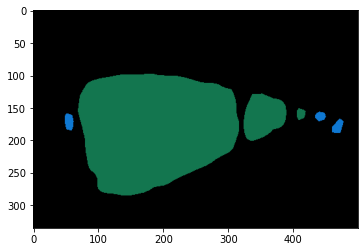

In [19]:
testimg = test_df['img'][400]
testimg = Image.fromarray(testimg)
testtensor = preprocess(testimg)
testbatch = testtensor.unsqueeze(0) # create a mini-batch as expected by the model
# move the input and model to GPU for speed if available
model2.eval()
if torch.cuda.is_available():
    testbatch = testbatch.to('cuda')
    model2.to('cuda')

with torch.no_grad():
    output = model2(testbatch)['out'][0]
testpred = output.argmax(0)
r = Image.fromarray(testpred.byte().cpu().numpy()).resize(testimg.size)
r.putpalette(colors)
plt.imshow(r)

Comparing to the prediction come from fine-tuned model:



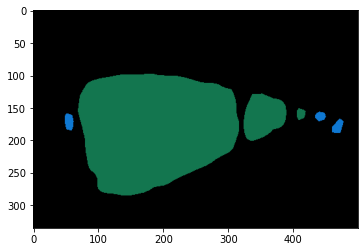

In [20]:
testimg = test_df['img'][400]
testimg = Image.fromarray(testimg)
testtensor = preprocess(testimg)
testbatch = testtensor.unsqueeze(0) # create a mini-batch as expected by the model
# move the input and model to GPU for speed if available
deeplabModel.eval()
if torch.cuda.is_available():
    testbatch = testbatch.to('cuda')
    deeplabModel.to('cuda')

with torch.no_grad():
    output = deeplabModel(testbatch)['out'][0]
testpred = output.argmax(0)
r = Image.fromarray(testpred.byte().cpu().numpy()).resize(testimg.size)
r.putpalette(colors)
plt.imshow(r)

This function is used to convinently predict for all test images reside in the pre-loaded test dataframe. For the aim of submission, here we also fill in the classification results directly dereived from segmentation task in a manner that once an occurance of a class is spotted on the segmentation prediction matrix, it will set the corresponding classification result of that class to be 1:

In [21]:
def predictSS(model, data_df, preprocessor):
    # Set model to evaluate mode
    model.eval()  
    
    for i in data_df.index:
        img = Image.fromarray(data_df.at[i, 'img'])    
        _tensor = preprocessor(img)
        _batch = _tensor.unsqueeze(0)
        
        # move the input and model to GPU for speed if available
        if torch.cuda.is_available():
            _batch = _batch.to('cuda')
            model.to('cuda')
        
        with torch.no_grad():
            _out = model(_batch)['out'][0].argmax(0)
            
        out = _out.data.cpu().numpy()
        
        # assign classification labels:
        for j in np.arange(0,20):
            if (j+1) in out:
                data_df.iat[i,j] = 1
            else:
                data_df.iat[i,j] = 0
        
#         data_df.at[i, 'seg'] = np.resize(out, img.shape[:2])
        data_df.at[i, 'seg'] = out
        
    return

In [22]:
predictSS(model2, test_df, preprocess)

In [23]:
test_df.head()

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,1,0,1,0,0,"[[[146, 95, 92], [131, 87, 84], [156, 137, 133...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,"[[[121, 122, 108], [121, 122, 106], [125, 122,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,"[[[255, 255, 255], [255, 255, 255], [255, 255,...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
4,0,0,0,0,1,0,0,0,1,0,...,0,0,1,0,0,1,0,0,"[[[71, 69, 74], [73, 71, 76], [80, 78, 83], [7...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


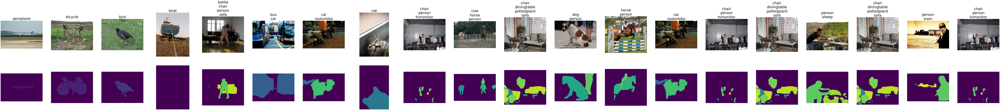

In [24]:
# Show some examples from generated test dataframe:
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = test_df.loc[test_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

In this part we tried to predict directly from a pre-trained model and predict after fine-tuning using the dataset provided. Contrary to what we expect, the performance looks a bit better (~0.84 accuracy versus ~0.80 accuracy) from the directly prediction. Possible reason can be that during pre-processing input data, we resize each image to a square size of (400,400), which will have objects’ shape unproportionally elongated or widened, which confused the model as it is fine-tuned.

### 3.2.5. Discussion segmentation

Due to the nature of the segmentation task it is much more difficult to train than the classification task. During training from scratch we see very poor performance. This is reasonable because we have limited data. However, if we directly use a pretrained model we see a big improvement in performance. We can say that choosing an appropriate model can help with tackling the problem because the DeepLab model is trained on the COCOtrain2017 dataset, which has the exact same classes as the PASCAL dataset but different pictures of the objects.

**Ref:**

[1] U-Net: Convolutional Networks for Biomedical Image Segmentation

[2] [1706.05587] Rethinking Atrous Convolution for Semantic Image Segmentation

[3] Spatial Pyramid Pooling in Deep Convolutional Networks

[4] Deeplabv3-ResNet101

## Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [25]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

In [26]:
generate_submission(test_df)

,Predicted
Id,
0_classification,9 1 15 1 20 1
0_segmentation,1653623 2 1654123 2 1658140 8 1658638 12 16591...
1_classification,9 1 11 1 16 1 18 1
1_segmentation,1763501 4 1764001 5 1764030 3 1764501 6 176452...
2_classification,9 1 11 1 18 1
...,...
747_segmentation,396115 10 396614 13 397113 15 397612 18 398112...
748_classification,5 1 15 1 20 1
748_segmentation,868227 1 868725 6 869225 9 869725 11 870224 12...


# 4. Adversarial attack
In this part we will try to fool the classification CNN using an advererial attack. 

Our task is defined as followed:

* We will perturb the original images such that the CNN classifer will predict **'cat'** label for the image, while the image actually have **'dog'** label.

To achieve this task, we need to build adversarial model diagram as shown below:
![](https://github.com/LinyeLyuNeo/CV_Deep_Learning/blob/main/adversary%20model.png?raw=true)

In this figure, $X$ is the original input images. $f_{\theta_a}$ is the adversarial model which generates the adversarial noise $\delta$ using the input images. Then the adversarid noise and original input images are added, which is $X+\delta$, as the input of the classifier $h_{\theta_c}$. Then the classifer generates the prediction label $\hat{y}_{dec}$. Then we will compute a loss function based on the prediction label $\hat{y}_{dec}$ and $y_{dec}$ , which is the desired deceptive label that we want to trick our classfier. During the training, we will try to minimize the value of this loss function. 

## 4.0 Load the training data

In [27]:
from keras.models import Model, load_model,Sequential
from keras.applications import MobileNetV2
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Activation, GlobalAveragePooling2D, Dropout, Lambda

import os
import cv2
import matplotlib.pyplot as plt
import urllib.request

import numpy as np
from numpy import *
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer, MultiLabelBinarizer
from sklearn.metrics import average_precision_score

import tensorflow as tf
import keras
from keras import backend as K
from keras import utils, regularizers
from keras.applications import VGG16
from keras.models import Sequential, Model, load_model
from keras.layers import Input, Dense, Convolution2D, Conv2D, MaxPooling2D, AveragePooling2D, ZeroPadding2D, Dropout, Flatten, Concatenate, Reshape, Activation, BatchNormalization, GlobalAveragePooling2D, Add, ActivityRegularization
from keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img
from keras.regularizers import l2
from keras.optimizers import SGD
from keras.utils.conv_utils import convert_kernel
from keras.metrics import Precision, Recall
from keras.callbacks import ModelCheckpoint
from keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adadelta
from tensorflow.keras.metrics import Precision, Recall
from tensorflow_addons.metrics import HammingLoss, F1Score

In [28]:
import os

prep_path = '../input/a1-clf-imagedata-tensor/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
X = np.load(os.path.join(prep_path, 'Xtrain_224.npy'))
y = np.load(os.path.join(prep_path, 'Ytrain.npy'))
X_pred = np.load(os.path.join(prep_path, 'Xtest_224.npy'))

from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

print("Number of training examples: {}".format(len(y_train)))
print("Number of validation examples: {}".format(len(y_val)))

Number of training examples: 599
Number of validation examples: 150


## 4.1 Load and freeze the classifier 

First step we need to load a classifer which has decent performance on our training data. We used a pretrained MobileNetV2 model with weights from imagenet. Then we trained this model with our training data.

In [29]:
from keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adadelta
from tensorflow.keras.metrics import Precision, Recall
from tensorflow_addons.metrics import HammingLoss, F1Score

base_model = MobileNetV2(input_shape=(224,224,3), include_top=False, weights='imagenet')
base_model.trainable = False
#model = Sequential([
#  base_model,
#  GlobalAveragePooling2D(),
#  Dense(20, activation='sigmoid')
#])
#model.compile(optimizer='adam',
#              loss=config.loss_function,
#              metrics=['accuracy',F1Score(num_classes=20),Precision(),Recall()])

#model.summary()

9412608/9406464 [==============================] - 0s 0us/step


Build an ImageDataGenerator object for data augmentation. 

In [30]:
from keras.models import load_model
 
datagen = ImageDataGenerator(rotation_range=30, width_shift_range=0.2
                               ,height_shift_range=0.2, shear_range=0.2,zoom_range=0.2
                               ,fill_mode="nearest", horizontal_flip=True)
datagen.fit(X_train)

Let's train the classifier model.

In [31]:
#history = model.fit(datagen.flow(X_train, y_train, batch_size=config.batch_size),
#                          validation_data=(X_val, y_val),
#                          epochs=config.epochs, verbose=1, workers=4, shuffle=True, callbacks=[WandbCallback()])

#model.save('clf_transfer_mobilenetv2_best.h5')

Load the trained model for image classification

In [32]:
model = load_model('../input/trained-models/clf_transfer_mobilenetv2_best.h5')

Let's check the model performance on the training and test set

In [33]:
# Print out the classification metrics per class for training data
from sklearn import metrics
from sklearn.metrics import classification_report

preds = np.round(model.predict(X_train), 0)
classification_metrics = metrics.classification_report(y_train, preds, target_names=labels)
print(classification_metrics)

# Print mean Average Precision score
print("mAP: {:.2f}%".format(average_precision_score(y_train, preds) * 100))

              precision    recall  f1-score   support

   aeroplane       1.00      0.92      0.96        37
     bicycle       0.84      0.79      0.82        34
        bird       1.00      0.78      0.88        46
        boat       0.92      0.95      0.93        37
      bottle       0.89      0.83      0.86        30
         bus       1.00      0.78      0.88        32
         car       0.94      0.67      0.78        51
         cat       1.00      0.83      0.91        30
       chair       0.91      0.57      0.70        54
         cow       0.74      0.74      0.74        27
 diningtable       0.95      0.45      0.61        42
         dog       0.91      0.72      0.81        29
       horse       0.85      0.82      0.84        34
   motorbike       0.97      0.94      0.96        36
      person       0.98      0.68      0.80       171
 pottedplant       0.95      0.61      0.75        31
       sheep       0.88      0.91      0.89        23
        sofa       0.81    

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [34]:
# Print out the classification metrics per class for validation data
preds = np.round(model.predict(X_val), 0)
classification_metrics = metrics.classification_report(y_val, preds, target_names=labels)
print(classification_metrics)
print('')

# Print mean Average Precision score
print("mAP: {:.2f}%".format(average_precision_score(y_val, preds) * 100))

              precision    recall  f1-score   support

   aeroplane       0.90      0.90      0.90        10
     bicycle       0.80      0.80      0.80         5
        bird       1.00      0.67      0.80         9
        boat       1.00      0.73      0.84        11
      bottle       1.00      0.25      0.40        12
         bus       1.00      0.67      0.80         6
         car       0.86      0.50      0.63        12
         cat       1.00      0.60      0.75        15
       chair       0.75      0.40      0.52        15
         cow       0.67      0.67      0.67         3
 diningtable       0.00      0.00      0.00         6
         dog       1.00      0.29      0.44        14
       horse       0.80      0.50      0.62         8
   motorbike       1.00      0.73      0.84        11
      person       0.95      0.53      0.68        36
 pottedplant       1.00      0.17      0.29        12
       sheep       0.29      0.50      0.36         4
        sofa       0.56    

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


From the performance metrics above, we can see that the classifier has a decent performance for the **dog and cat class**. Now let's plot some pictures with their actual and prediction labels from the validation set.

In [35]:
def get_picture_label(y):
    title = []

    for i, element in enumerate(y):
        
        if element == 1:
            title.append(labels[i])
            
    return title 

Pictures with their actual labels:

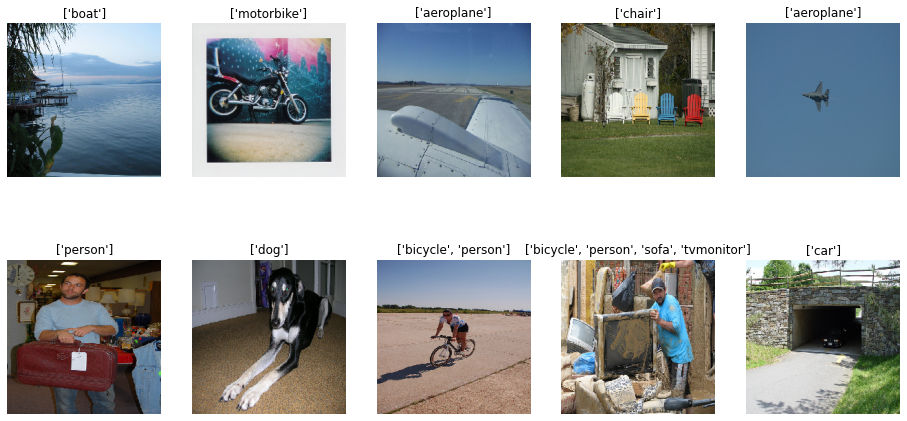

In [36]:
fig=plt.figure(figsize=(16, 8))
columns = 5
rows = 2

for i in range(columns * rows):

    img = X_val[i]
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.title(get_picture_label(y_val[i]))
    plt.axis('off')
    
plt.show()

Pictures with their prediction labels:

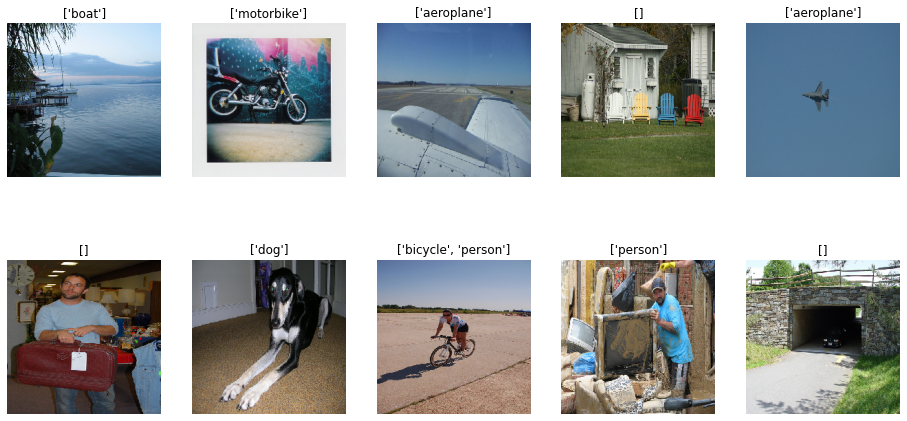

In [37]:
fig=plt.figure(figsize=(16, 8))
columns = 5
rows = 2

for i in range(columns * rows):

    img = X_val[i]
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.title(get_picture_label(preds[i]))
    plt.axis('off')
    
plt.show()

We confirmed that the classifier model was ready to use. Then we need to freeze the weights of the model that we are trying to attack so that they do not change while training:

In [38]:
classification_model = model
for layer in classification_model.layers:
    layer.trainable = False

## 4.2 Create the deceptive label  
We will take out all images originally with 'dog' label. We will find their original labels, of which we will remove the 'dog' label but add the 'cat' label. 

In [39]:
def get_index_of_class(class_name):
    
    for i, label in enumerate(labels):
        if class_name == label:
            return i
            
    return -1 

In [40]:
dog_index = get_index_of_class('dog')
print(dog_index)

11


take all the images containing dog in the training set

In [41]:
X_train_dog = np.array([X_train[i] for i in range(len(y_train)) if y_train[i][dog_index] == 1])
y_train_dog = np.array([y_train[i] for i in range(len(y_train)) if y_train[i][dog_index] == 1])

print(X_train.shape)
print(X_train_dog.shape)

(599, 224, 224, 3)
(29, 224, 224, 3)


We have 29 images in the training set that contain 'dog' label. Some of the examples are shown below:

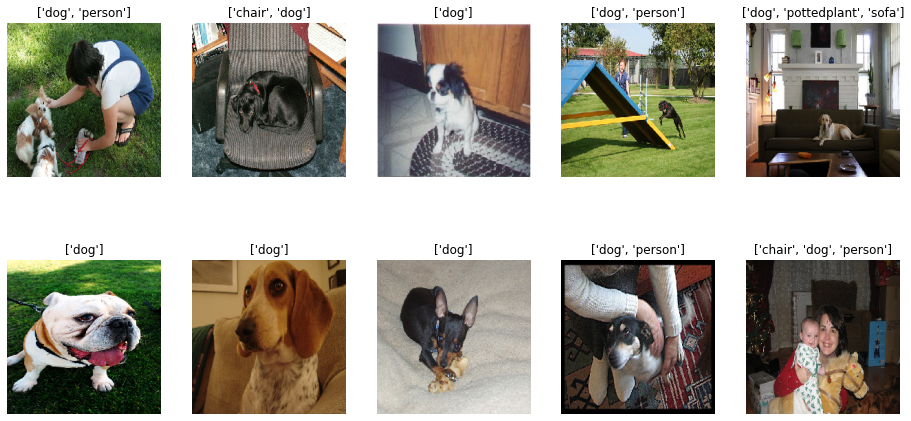

In [42]:
fig=plt.figure(figsize=(16, 8))
columns = 5

rows = 2

for i in range(columns * rows):

    img = X_train_dog[i]
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.title(get_picture_label(y_train_dog[i]))
    plt.axis('off')
    
plt.show()

Now we need to relabel all the dog images with cat label. 

In [43]:
y_train_dog_cat = y_train_dog.copy()

cat_index = get_index_of_class('cat')

for i in range(len(y_train_dog)):
    y_train_dog_cat[i][dog_index] = 0 # not a dog
    y_train_dog_cat[i][cat_index] = 1 # but a cat

Some of the relabeled images are shown below, where we see that **dogs are now labeled as cats**:

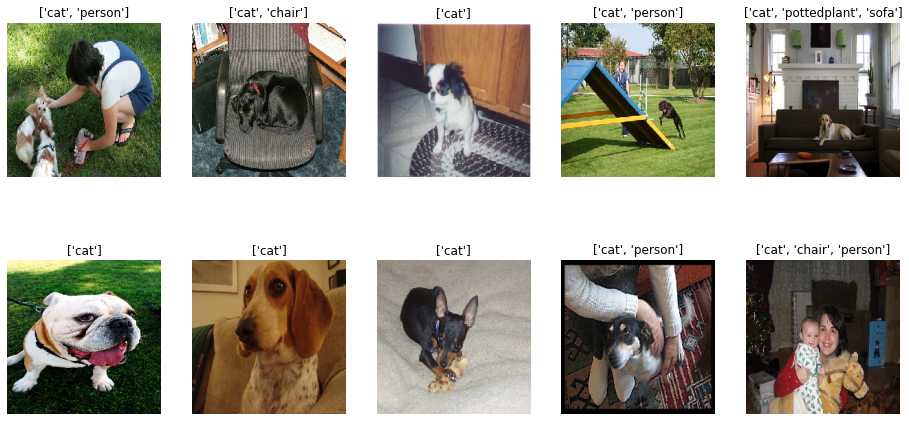

In [44]:
fig=plt.figure(figsize=(16, 8))
columns = 5

rows = 2

for i in range(columns * rows):

    img = X_train_dog[i]
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.title(get_picture_label(y_train_dog_cat[i]))
    plt.axis('off')
    
plt.show()

## 4.3 Create the adversarial (autoencoder) model
Now let's define the model to generate the adversarial noise. The model is an autoencoder, which is defined below:

In [45]:
def conv_autoencoder():

    input_shape = (224,224,3)

    input_img = Input(shape=input_shape)
    
    x = Conv2D(64, (3, 3), padding='same')(input_img)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)
    
    x = Conv2D(32, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)
    
    x = Conv2D(16, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    encoded = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(16, (3, 3), padding='same')(encoded)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = UpSampling2D((2, 2))(x)
    
    x = Conv2D(32, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = UpSampling2D((2, 2))(x)
    
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = UpSampling2D((2, 2))(x)
    
    x = Conv2D(3, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    decoded = Activation('tanh')(x)
    
    autoencoder = keras.Model(input_img, decoded)
    return autoencoder

create the autoencoder model and show its model summary:

In [46]:
adversarial_model = conv_autoencoder()

adversarial_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 224, 224, 64)      1792      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 64)      256       
_________________________________________________________________
activation (Activation)      (None, 224, 224, 64)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 112, 112, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 112, 112, 32)      18464     
_________________________________________________________________
batch_normalization_1 (Batch (None, 112, 112, 32)      128   

## 4.4 Build and train the combined model 
Now we need to create the combined model with autoencoder and classifier based on the figure show below:
![](https://github.com/LinyeLyuNeo/CV_Deep_Learning/blob/main/adversary%20model.png?raw=true)

In order to build the above combined architecture, we use the following code block:

In [47]:
inputs = keras.layers.Input(shape=(224, 224, 3)) # create the inputs layer
delta = adversarial_model(inputs) # delta is the output of the autoencoder model 
delta = ActivityRegularization(l2=1e-3)(delta)  # Apply L2 regularzation to make the delta small
input_plus_delta = keras.layers.Add()([inputs, delta]) # add the inputs and delta to get the combined input images, which will be the input images of the classifer
outputs = classification_model(input_plus_delta) # the outputs will be the classifier prediction
combined_model = keras.Model(inputs=inputs, outputs=outputs) # create the combined model with autoencoder and classifier 

In [48]:
combined_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
model (Functional)              (None, 224, 224, 3)  52975       input_3[0][0]                    
__________________________________________________________________________________________________
activity_regularization (Activi (None, 224, 224, 3)  0           model[0][0]                      
__________________________________________________________________________________________________
add (Add)                       (None, 224, 224, 3)  0           input_3[0][0]                    
                                                                 activity_regularization[0][

We could use the above combined_model for training. However, considering we only have 29 examples for training, we **further simplify this model as a binary classifer**: we add one more dense layer with 2 output to the combine_model. And we set the inital weights between the 20-dense layer and 2-dense layer. The activation on the cat label is fully activated.

In [49]:
dog_cat_outputs = Dense(2, use_bias=False)(outputs)
combined_model_dog_cat = keras.Model(inputs=inputs, outputs=dog_cat_outputs)
dog_cat_dense_weights = np.zeros((20, 2), dtype='float')
dog_cat_dense_weights[dog_index, 0] = 1
dog_cat_dense_weights[cat_index, 1] = 1
combined_model_dog_cat.layers[-1].set_weights([dog_cat_dense_weights]) 
combined_model_dog_cat.layers[-1].trainable = False

In [50]:
from tensorflow.keras.optimizers import Adadelta
from tensorflow.keras.metrics import Precision, Recall
from tensorflow_addons.metrics import HammingLoss, F1Score


combined_model_dog_cat.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy',Precision(),Recall()])
combined_model_dog_cat.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
model (Functional)              (None, 224, 224, 3)  52975       input_3[0][0]                    
__________________________________________________________________________________________________
activity_regularization (Activi (None, 224, 224, 3)  0           model[0][0]                      
__________________________________________________________________________________________________
add (Add)                       (None, 224, 224, 3)  0           input_3[0][0]                    
                                                                 activity_regularization[0][

Now we train the combined_model_dog_cat with all the dog images with label as cat.

In [51]:
#combined_model_dog_cat.fit(X_train_dog, np.array([[0, 1]] * len(X_train_dog)), batch_size=config.batch_size, epochs=config.epochs,
#                             callbacks=[WandbCallback()], verbose=1)

#adversarial_model.save('adversarial_anencoder_v1.0.h5')

## 4.5 Visualization of the test images, perturbation and perturbed test image
Let's now show some examples of the test images, perturbation and perturbed test image. 

In [52]:
adversarial_model = load_model('../input/trained-models/adversarial_anencoder_v1.0.h5')

classification_model = load_model('../input/trained-models/clf_transfer_mobilenetv2_best.h5')

In [53]:
def get_label_conf(y_preds):
    
    y_preds_bin = np.round(y_preds, 0)
    y_pred_labels_with_conf = []
    
    y_preds_bin_transpose = y_preds_bin.transpose()
           
    for i,value in enumerate(y_preds_bin_transpose):
        if y_preds_bin_transpose[i][0] == 1:
            
            y_pred_labels = labels[i]
            y_pred_labels_with_conf.append(y_pred_labels + " ({:.2f})".format(y_preds[0][i]))

    return y_pred_labels_with_conf

In [54]:
random_indices = list(range(len(X_train_dog)))
random.shuffle(random_indices)
random_indices_iter = iter(random_indices)

Classifier prediction with noise: ['cat (0.76)']
Classifier prediction without noise: ['dog (0.82)', 'horse (0.53)']
True labels: ['chair (1.00)', 'dog (1.00)']
Deceptive labels: ['cat (1.00)', 'chair (1.00)']


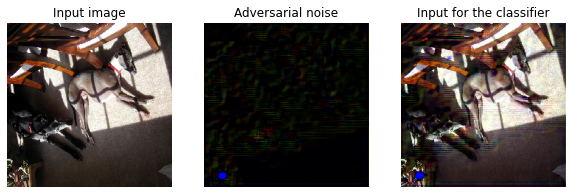

In [55]:
#train
fig=plt.figure(figsize=(10, 10))

i = next(random_indices_iter)
# print(i)
x = X_train_dog[i]
delta = adversarial_model.predict(np.array([x]))[0]
x_plus_delta = x + delta

# img = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
fig.add_subplot(1, 3, 1)
plt.imshow(x)
plt.title("Input image")
plt.axis('off')

# img = cv2.cvtColor(delta, cv2.COLOR_BGR2RGB)
fig.add_subplot(1, 3, 2)
plt.imshow(delta)
plt.title("Adversarial noise")
plt.axis('off')

# img = cv2.cvtColor(x_plus_delta, cv2.COLOR_BGR2RGB)
fig.add_subplot(1, 3, 3)
plt.imshow(x_plus_delta)
plt.title("Input for the classifier")
plt.axis('off')

y_pred_clean = classification_model.predict(np.array([x]))
y_pred_noise = classification_model.predict(np.array([x_plus_delta]))

print("Classifier prediction with noise: {}".format(get_label_conf(y_pred_noise)))
print("Classifier prediction without noise: {}".format(get_label_conf(y_pred_clean)))
print("True labels: {}".format(get_label_conf(np.array([y_train_dog[i]]))))
print("Deceptive labels: {}".format(get_label_conf(np.array([y_train_dog_cat[i]]))))

Classifier prediction with noise: []
Classifier prediction without noise: ['dog (0.73)']
True labels: ['dog (1.00)']
Deceptive labels: ['cat (1.00)']


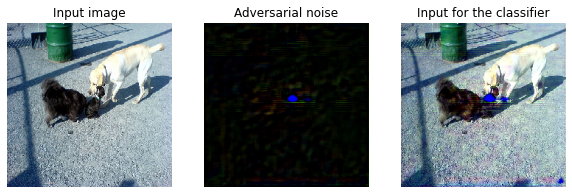

In [56]:

fig=plt.figure(figsize=(10, 10))

i = next(random_indices_iter)
# print(i)
x = X_train_dog[i]
delta = adversarial_model.predict(np.array([x]))[0]
x_plus_delta = x + delta

# img = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
fig.add_subplot(1, 3, 1)
plt.imshow(x)
plt.title("Input image")
plt.axis('off')

# img = cv2.cvtColor(delta, cv2.COLOR_BGR2RGB)
fig.add_subplot(1, 3, 2)
plt.imshow(delta)
plt.title("Adversarial noise")
plt.axis('off')

# img = cv2.cvtColor(x_plus_delta, cv2.COLOR_BGR2RGB)
fig.add_subplot(1, 3, 3)
plt.imshow(x_plus_delta)
plt.title("Input for the classifier")
plt.axis('off')

y_pred_clean = classification_model.predict(np.array([x]))
y_pred_noise = classification_model.predict(np.array([x_plus_delta]))

print("Classifier prediction with noise: {}".format(get_label_conf(y_pred_noise)))
print("Classifier prediction without noise: {}".format(get_label_conf(y_pred_clean)))
print("True labels: {}".format(get_label_conf(np.array([y_train_dog[i]]))))
print("Deceptive labels: {}".format(get_label_conf(np.array([y_train_dog_cat[i]]))))

## 4.6 Discussion 
On most pictures, we were able to trick the network into predicting dogs to be cats. In general, pictures with more labels were less likely to get the attack as we designed. However, the noise that was added is noticeable. Besides some unnoticeable noise, the model has learned where to add blue blobs so that the networks makes this mistake. We did not manage to make this noise invisible for the bare eye. The dogs however, do still look like dogs so this has not changed, which is why we think our attack was still somewhat succesful.

Although it works, this attack would be very hard to perform in realistic scenario's. We now have access to the model's weights and based on this we were able to deceive it. If we would only have the input and output of the model (black box), we would not have been able to do this! 


To make our model more robust, we can base ourselves on the adversarial attack part, some possibilities are:
- Adversarial training with perturbation or noise. In our case, we can use the perturbed images from previous part as extra training data to train the model to reduce the classification error. However, this method can be very useful for a specific attack but not for others.
- Applying denoising to the input images. So we can remove the added noise.
- Ensemble adversarial training. Multiple models are trained together and combined to make the prediction more robust.

# 5. General discussion

In summary, we think that the most important thing we learned in the classification and segmentation part was how powerful transfer learning can be with a very limited dataset. Training from scratch got really bad results for both. The models overfit, and the features that were found were too specific to the training data and did not generalize well. With the frozen weights from imagenet, only the last layer was trained. The good results indicated that the features that were learned from the ImageNet dataset were also very useful for the PASCAL dataset. Transfer learning based on DeepLabV3 model also achieved favorable results. It has to be noted that directly predictions from DeepLabV3 behave better than predictions after fine-tuning using the dataset provided. The improvement can be explained by the advantages of DeepLabV3 which makes it possible to increase receptive field and capture multi-scale information. Transfer learning can save a lot of time in collecting annotated pictures: 750 pictures would already be quite a lot to annotate by oneself and to get good results with a classifier from scratch we would even need much more! For companies, this means valuable time is lost and less time is spent on the actual model building and evaluation. When you really want to train from scratch, looking into [image annotation companies](https://lionbridge.ai/articles/5-best-image-annotation-companies-for-big-data-outsourcing/) could be useful. We conclude that with few examples and a similar dataset, transfer learning is usually preferred over starting from scratch.




We think the importance of the adversarial attack depends a lot on the use case. The outcome of these networks are really made with as goal to confuse the network. That is why sometimes we think it is okay to not pay too much attention to this. If one would use computer vision [in its own company to classify food quality](https://www.sciencedirect.com/book/9780128022320/computer-vision-technology-for-food-quality-evaluation) in its own company for example, we don't think that this is that important. However, if computer vision would be used in [an app where one has to take a picture of his broken car to calculate the insurance claim that will be received](https://www.youtube.com/watch?v=ztGD0vVxIBM), the developers will have to pay extra attention to the robustness and vulnerabilities of their model!

If we would have gotten more time, we would try to improve our adversarial attack so that it is not possible to distinguish between the real and the perturbed pictures anymore. We could somehow try to limit the amount of noise so that it is more spread out accross the picture and less visible.